# Import libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn import metrics
import statsmodels.api as sm

import pylab as py
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import plot_confusion_matrix
from sklearn.svm import SVC
from sklearn.metrics import roc_curve


# Import Data

In [2]:
Alert_data = pd.read_excel('alerts_created.xlsx')
Alert_data.head()
Alert_data.shape

(102225, 23)

In [3]:
Alert_data['data'] = Alert_data['data'].astype(str) + Alert_data['is_active'].astype(str) + Alert_data['is_deleted'].astype(str)
Alert_data.head()

,id,user_id,type,market,currency,data,is_active,is_deleted,max_notifications,notifications,...,updated_at,deleted_at,last_checked,last_sent,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22
0,3,1343,price_point,POLONIEX,XRP_USD,"{\comparison\"":\""sell_price\""\""value\"":\""0.32\...","\""value\"":\""0.32\""","\""operator\"":\"">=\""}""",1,0,...,NaN,2017-01-17 07:45:21,2019-07-12 22:29:03,NaN,NaT,NaT,NaT,NaN,NaN,NaN
1,5,1344,price_point,BITTREX,BTC_TRIG,"{\comparison\"":\""buy_price\""\""value\"":\"".00000...","\""value\"":\"".0000071\""","\""operator\"":\"">=\""}""",0,0,...,NaN,2017-01-17 08:45:31,2017-01-17 08:46:26,NaN,NaT,NaT,NaT,NaN,NaN,NaN
2,6,1345,regular_update,BITSTAMP,BTC_EUR,"{\comparison\"":\""buy_price\""\""value\"":\""1day\""}""0","\""value\"":\""1day\""}""",0,0,NaN,...,2017-01-17 08:50:15,2017-03-31 23:00:19,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
3,7,1348,price_point,BITSTAMP,BTC_EUR,"{\comparison\"":\""buy_price\""\""value\"":\""600\""\...","\""value\"":\""600\""","\""operator\"":\""<=\""}""",0,1,...,NaN,2017-01-17 12:11:20,2019-01-06 03:06:52,2018-04-29 08:40:49,NaT,NaT,NaT,NaN,NaN,NaN
4,8,1348,price_point,BITSTAMP,BTC_USD,"{\comparison\"":\""buy_price\""\""value\"":\""650\""\...","\""value\"":\""650\""","\""operator\"":\""<=\""}""",0,1,...,NaN,2017-01-17 12:11:43,2018-04-29 08:40:45,2018-04-29 08:40:45,NaT,NaT,NaT,NaN,NaN,NaN


In [4]:
Alert_data = Alert_data.drop('is_active', axis = 1)
Alert_data = Alert_data.drop('is_deleted', axis = 1)

In [5]:
Alert_data.columns = ['id', 'user_id', 'type', 'market', 'currency', 'data', 'is_active',
       'is_deleted', 'max_notifications', 'notifications', 'snooze',
       'custom_message', 'created_at', 'updated_at', 'deleted_at',
       'last_checked', 'last_sent', 'Unnamed: 17', 'Unnamed: 18',
       'Unnamed: 19', 'Unnamed: 20']

In [6]:
Alert_data = Alert_data.drop(Alert_data.columns[[11, 17, 18, 19, 20]], axis = 1)

# Subsetting Over Price Point

In [7]:
Alert_price_point = Alert_data[Alert_data['type'] == 'price_point']
Alert_price_point = Alert_price_point.reset_index()

In [8]:
Alert_price_point = Alert_price_point.drop('index', axis = 1)

# Splitting 'Data' Column

In [9]:
import json
# val = Alert_price_point.iloc[0]["data"]
# print(val)
def convert_str_to_proper_dict(val):
  val = r'"' + val
  val = val[:3] + '"' + val[3:]
  val = val.replace(r'\"\"', r'\",\"')
  val = val.replace('null', 'null,')
  val = "".join(val.split())
  return json.loads(json.loads(val))

In [10]:
q = list(Alert_price_point["data"])
for idx, val in enumerate(q):
  try:
    convert_str_to_proper_dict(val)
  except:
    print(f"idx is {idx}")
    break

In [11]:
print(q[23811].strip())
convert_str_to_proper_dict(q[23811])

{\comparison\":\"buy_price\"\"value\":\"	0.0009\"\"operator\":\">=\"}"


{'comparison': 'buy_price', 'value': '0.0009', 'operator': '>='}

In [12]:
Alert_price_point["data"] = Alert_price_point["data"].apply(convert_str_to_proper_dict)

In [13]:
json_df = pd.json_normalize(Alert_price_point["data"])
# json_df

# Merging the splitted column back to the original data

In [14]:
JSON_price_point_df = pd.concat([Alert_price_point, json_df], axis = 1)
JSON_price_point_df.head()

,id,user_id,type,market,currency,data,is_active,is_deleted,max_notifications,notifications,snooze,created_at,updated_at,deleted_at,last_checked,last_sent,comparison,value,operator
0,3,1343,price_point,POLONIEX,XRP_USD,"{'comparison': 'sell_price', 'value': '0.32', ...",1,0,6,4,5min,2017-01-17 07:45:21,2019-07-12 22:29:03,NaN,NaT,NaT,sell_price,0.32,>=
1,5,1344,price_point,BITTREX,BTC_TRIG,"{'comparison': 'buy_price', 'value': '.0000071...",0,0,1,0,5min,2017-01-17 08:45:31,2017-01-17 08:46:26,NaN,NaT,NaT,buy_price,.0000071,>=
2,7,1348,price_point,BITSTAMP,BTC_EUR,"{'comparison': 'buy_price', 'value': '600', 'o...",0,1,1,2,5min,2017-01-17 12:11:20,2019-01-06 03:06:52,2018-04-29 08:40:49,NaT,NaT,buy_price,600,<=
3,8,1348,price_point,BITSTAMP,BTC_USD,"{'comparison': 'buy_price', 'value': '650', 'o...",0,1,1,2,5min,2017-01-17 12:11:43,2018-04-29 08:40:45,2018-04-29 08:40:45,NaT,NaT,buy_price,650,<=
4,9,1348,price_point,KRAKEN,LTC_EUR,"{'comparison': 'buy_price', 'value': '2.5', 'o...",0,1,1,0,5min,2017-01-17 12:13:31,2018-04-29 08:40:40,2018-04-29 08:40:40,NaT,NaT,buy_price,2.5,<=


In [15]:
JSON_price_point_df['created_at'] = pd.to_datetime(JSON_price_point_df['created_at'])

In [16]:
JSON_price_point_df.shape

(80512, 19)

# Checking for null values

In [17]:
JSON_price_point_df.isnull().sum().sum()

212670

# Dropping irrelevant columns

In [18]:
JSON_price_point_df = JSON_price_point_df.drop(JSON_price_point_df.columns[[12, 13, 14, 15]], axis = 1)
JSON_price_point_df = JSON_price_point_df.drop(JSON_price_point_df.columns[[5]], axis = 1)
JSON_price_point_df.head()

,id,user_id,type,market,currency,is_active,is_deleted,max_notifications,notifications,snooze,created_at,comparison,value,operator
0,3,1343,price_point,POLONIEX,XRP_USD,1,0,6,4,5min,2017-01-17 07:45:21,sell_price,0.32,>=
1,5,1344,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,2017-01-17 08:45:31,buy_price,.0000071,>=
2,7,1348,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,2017-01-17 12:11:20,buy_price,600,<=
3,8,1348,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,2017-01-17 12:11:43,buy_price,650,<=
4,9,1348,price_point,KRAKEN,LTC_EUR,0,1,1,0,5min,2017-01-17 12:13:31,buy_price,2.5,<=


In [19]:
JSON_price_point_df.isnull().sum()

id                     0
user_id                0
type                   0
market                 0
currency             175
is_active              0
is_deleted             0
max_notifications      0
notifications          0
snooze                 0
created_at             0
comparison             0
value                418
operator               0
dtype: int64

# Dropping missing values

In [20]:
clean_JSON_price_point_df = JSON_price_point_df.dropna()
clean_JSON_price_point_df = clean_JSON_price_point_df.reset_index()
clean_JSON_price_point_df.head()

,index,id,user_id,type,market,currency,is_active,is_deleted,max_notifications,notifications,snooze,created_at,comparison,value,operator
0,0,3,1343,price_point,POLONIEX,XRP_USD,1,0,6,4,5min,2017-01-17 07:45:21,sell_price,0.32,>=
1,1,5,1344,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,2017-01-17 08:45:31,buy_price,.0000071,>=
2,2,7,1348,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,2017-01-17 12:11:20,buy_price,600,<=
3,3,8,1348,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,2017-01-17 12:11:43,buy_price,650,<=
4,4,9,1348,price_point,KRAKEN,LTC_EUR,0,1,1,0,5min,2017-01-17 12:13:31,buy_price,2.5,<=


In [21]:
clean_JSON_price_point_df.isnull().sum()

index                0
id                   0
user_id              0
type                 0
market               0
currency             0
is_active            0
is_deleted           0
max_notifications    0
notifications        0
snooze               0
created_at           0
comparison           0
value                0
operator             0
dtype: int64

# Convert "created_at" column to datetime 

In [22]:
clean_JSON_price_point_df['date'] = pd.to_datetime(clean_JSON_price_point_df['created_at']).dt.date
clean_JSON_price_point_df['time'] = pd.to_datetime(clean_JSON_price_point_df['created_at']).dt.time
clean_JSON_price_point_df.head()

,index,id,user_id,type,market,currency,is_active,is_deleted,max_notifications,notifications,snooze,created_at,comparison,value,operator,date,time
0,0,3,1343,price_point,POLONIEX,XRP_USD,1,0,6,4,5min,2017-01-17 07:45:21,sell_price,0.32,>=,2017-01-17,07:45:21
1,1,5,1344,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,2017-01-17 08:45:31,buy_price,.0000071,>=,2017-01-17,08:45:31
2,2,7,1348,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,2017-01-17 12:11:20,buy_price,600,<=,2017-01-17,12:11:20
3,3,8,1348,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,2017-01-17 12:11:43,buy_price,650,<=,2017-01-17,12:11:43
4,4,9,1348,price_point,KRAKEN,LTC_EUR,0,1,1,0,5min,2017-01-17 12:13:31,buy_price,2.5,<=,2017-01-17,12:13:31


# Splitting Currency column

In [23]:
d = Alert_price_point['currency'].str.split('_', n = 1, expand = True)
df1 = pd.DataFrame(d)
df1.columns = ["symbol", "currency_2"]

In [24]:
clean_JSON_price_point_df = pd.concat([clean_JSON_price_point_df, df1], axis = 1)

In [25]:
print(clean_JSON_price_point_df.dtypes)
# print(df_crypto_markets.dtypes)

index                       float64
id                          float64
user_id                     float64
type                         object
market                       object
currency                     object
is_active                    object
is_deleted                   object
max_notifications            object
notifications                object
snooze                       object
created_at           datetime64[ns]
comparison                   object
value                        object
operator                     object
date                         object
time                         object
symbol                       object
currency_2                   object
dtype: object


# Importing Market data

In [26]:
df_crypto_markets = pd.read_csv('crypto-markets.csv')
df_crypto_markets.head()
df_crypto_markets.shape

(942297, 13)

In [27]:
df_crypto_markets['date'] = pd.to_datetime(df_crypto_markets['date']).dt.date
clean_JSON_price_point_df['date'] = pd.to_datetime(clean_JSON_price_point_df['date']).dt.date

# Merging Alert data to the market data

In [28]:
alert_merge_df= pd.merge(clean_JSON_price_point_df, df_crypto_markets, how='left', on=['date', 'symbol'])
alert_merge_df.head()

,index,id,user_id,type,market_x,currency,is_active,is_deleted,max_notifications,notifications,...,name,ranknow,open,high,low,close,volume,market_y,close_ratio,spread
0,0.0,3.0,1343.0,price_point,POLONIEX,XRP_USD,1,0,6,4,...,XRP,2.0,0.006772,0.006848,0.006612,0.0068,1842150.0,2.500630e+08,0.7966,0.00
1,1.0,5.0,1344.0,price_point,BITTREX,BTC_TRIG,0,0,1,0,...,Bitcoin,1.0,830.950000,910.560000,830.800000,907.9400,155095008.0,1.462578e+10,0.9672,79.76
2,2.0,7.0,1348.0,price_point,BITSTAMP,BTC_EUR,0,1,1,2,...,Bitcoin,1.0,830.950000,910.560000,830.800000,907.9400,155095008.0,1.462578e+10,0.9672,79.76
3,3.0,8.0,1348.0,price_point,BITSTAMP,BTC_USD,0,1,1,2,...,Bitcoin,1.0,830.950000,910.560000,830.800000,907.9400,155095008.0,1.462578e+10,0.9672,79.76
4,4.0,9.0,1348.0,price_point,KRAKEN,LTC_EUR,0,1,1,0,...,Litecoin,7.0,3.910000,3.950000,3.850000,3.9400,4816480.0,1.945198e+08,0.9000,0.10


In [29]:
alert_merge_df.shape

(80686, 30)

In [30]:
alert_merge_df = alert_merge_df.dropna()

In [31]:
alert_merge_df.isnull().sum()

index                0
id                   0
user_id              0
type                 0
market_x             0
currency             0
is_active            0
is_deleted           0
max_notifications    0
notifications        0
snooze               0
created_at           0
comparison           0
value                0
operator             0
date                 0
time                 0
symbol               0
currency_2           0
slug                 0
name                 0
ranknow              0
open                 0
high                 0
low                  0
close                0
volume               0
market_y             0
close_ratio          0
spread               0
dtype: int64

In [32]:
alert_merge_df.dtypes

index                       float64
id                          float64
user_id                     float64
type                         object
market_x                     object
currency                     object
is_active                    object
is_deleted                   object
max_notifications            object
notifications                object
snooze                       object
created_at           datetime64[ns]
comparison                   object
value                        object
operator                     object
date                         object
time                         object
symbol                       object
currency_2                   object
slug                         object
name                         object
ranknow                     float64
open                        float64
high                        float64
low                         float64
close                       float64
volume                      float64
market_y                    

In [33]:
# alert_BTC = alert_merge_df[[alert_merge_df['symbol'] == 'BTC'] & [alert_merge_df['symbol'] == 'USDT']]
# alert_BTC = alert_BTC.reset_index()

# Subsetting over Bitcoin (BTC)

In [34]:
alert_BTC = alert_merge_df[alert_merge_df['symbol'] == 'BTC']
alert_BTC = alert_BTC.reset_index()

In [35]:
alert_BTC = alert_BTC.drop('level_0', axis = 1)
alert_BTC = alert_BTC.drop('index', axis = 1)

In [36]:
alert_BTC.head()

,id,user_id,type,market_x,currency,is_active,is_deleted,max_notifications,notifications,snooze,...,name,ranknow,open,high,low,close,volume,market_y,close_ratio,spread
0,5.0,1344.0,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
1,7.0,1348.0,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
2,8.0,1348.0,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
3,18.0,1171.0,price_point,BTCE,BTC_USD,0,0,1,0,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
4,20.0,1331.0,price_point,BITBAYS,BTC_USD,0,0,1,2,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76


# EDA

Text(0, 0.5, 'Frequency')

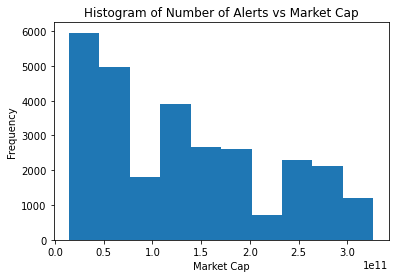

In [37]:
fig = plt.figure()
axes1 = fig.add_subplot(1, 1, 1)
axes1.hist(alert_BTC['market_y'], bins=10)
axes1.set_title('Histogram of Number of Alerts vs Market Cap')
axes1.set_xlabel('Market Cap')
axes1.set_ylabel('Frequency')

# Value counts for each crypto market. Bitcoin is about 45 percent of the data

In [38]:
alert_merge_df['symbol'].value_counts(20).head(20)

BTC     0.453064
ETH     0.134895
LTC     0.068649
USDT    0.055205
XRP     0.048074
BCH     0.021152
TRX     0.018861
EOS     0.009903
ADA     0.009743
XVG     0.008237
NEO     0.007435
XLM     0.007067
XMR     0.006650
ETC     0.006506
BNB     0.003445
ZEC     0.003221
DASH    0.003221
OMG     0.003077
ICX     0.003077
ETN     0.002195
Name: symbol, dtype: float64

In [39]:
alert_merge_df['currency_2'].value_counts(20).head(20)

USD     0.427136
BTC     0.175774
EUR     0.056935
ETH     0.048186
USDT    0.037450
XRP     0.018188
AUD     0.011906
NEO     0.010801
LTC     0.008157
BCC     0.006041
SC      0.005673
DGB     0.005096
CAD     0.004775
ADA     0.004631
OMG     0.004487
XVG     0.004455
XMR     0.004391
DASH    0.004086
ETC     0.004006
DOGE    0.003830
Name: currency_2, dtype: float64

<AxesSubplot:>

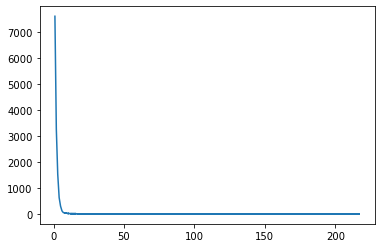

In [40]:
alert_BTC.groupby('user_id', sort = True)['date'].count().value_counts().plot()

In [41]:
alert_BTC_1 = alert_BTC.groupby(['date'])['market_y', 'high', 'low', 'open', 'close', 'volume'].mean()
alert_BTC_1.head()

<ipython-input-41-114a472db846>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  alert_BTC_1 = alert_BTC.groupby(['date'])['market_y', 'high', 'low', 'open', 'close', 'volume'].mean()


,market_y,high,low,open,close,volume
date,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0


In [42]:
#Feature engineering to generate percentage change
alert_BTC_1['high_daily_%_change'] = alert_BTC_1['high'].pct_change()
alert_BTC_1['low_daily_%_change'] = alert_BTC_1['low'].pct_change()
alert_BTC_1['open_daily_%_change'] = alert_BTC_1['open'].pct_change()
alert_BTC_1['close_daily_%_change'] = alert_BTC_1['close'].pct_change()
alert_BTC_1['volume_daily_%_change'] = alert_BTC_1['volume'].pct_change()
alert_BTC_1['market_daily_%_change'] = alert_BTC_1['market_y'].pct_change()

In [43]:
alert_BTC_1.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change
date,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046


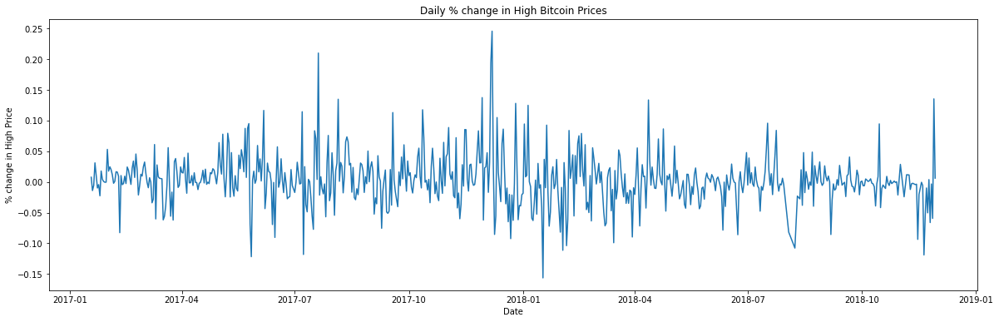

In [44]:
ax = alert_BTC_1['high_daily_%_change'].plot(title='Daily % change in High Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in High Price');


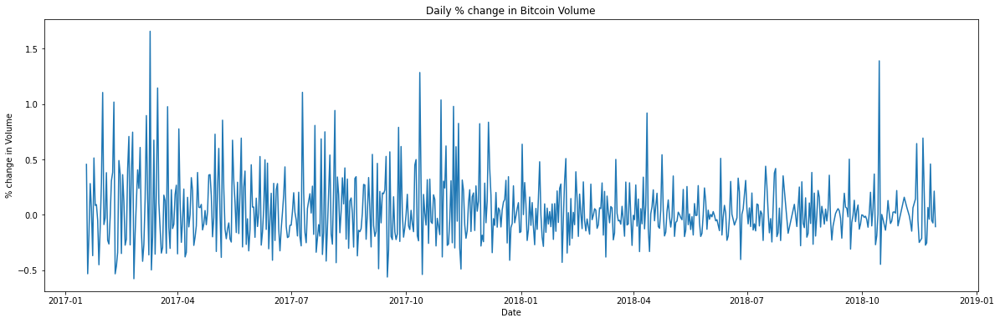

In [45]:
ax = alert_BTC_1['volume_daily_%_change'].plot(title='Daily % change in Bitcoin Volume', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in Volume');

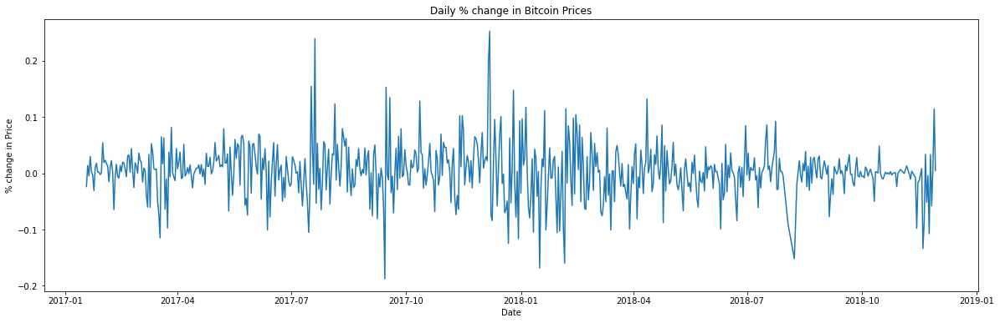

In [46]:
ax = alert_BTC_1['close_daily_%_change'].plot(title='Daily % change in Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in Price');

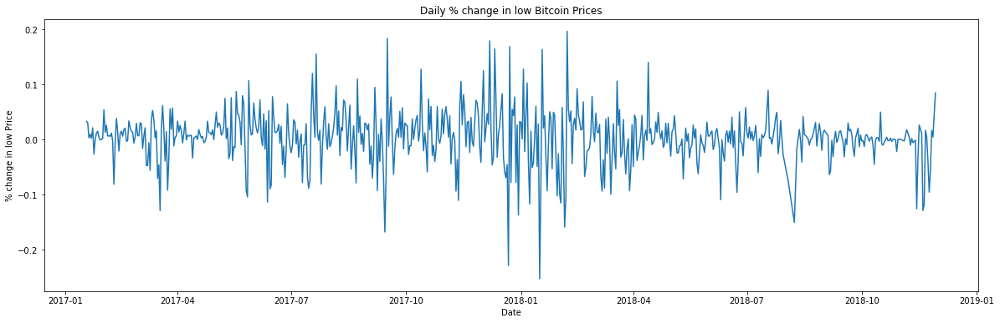

In [47]:
ax = alert_BTC_1['low_daily_%_change'].plot(title='Daily % change in low Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in low Price');

<AxesSubplot:xlabel='date'>

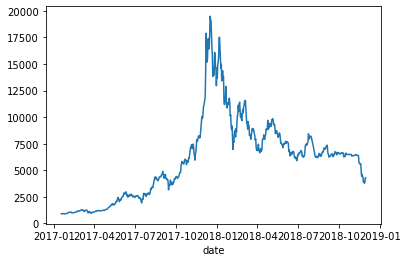

In [48]:
alert_BTC_1['close'].plot()

In [49]:
import matplotlib as mp

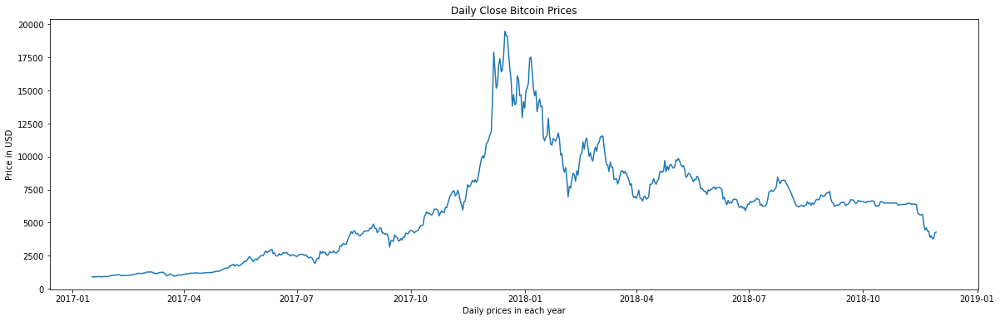

In [50]:
ax = alert_BTC_1['close'].plot(title='Daily Close Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Daily prices in each year')
ax.set_ylabel('Price in USD');
#ax.set_xticks(np.arange(2013,2018))
ax.xaxis.set_minor_formatter(mp.dates.DateFormatter('%m'))

In [51]:
alert_BTC_1.isnull().sum()

market_y                 0
high                     0
low                      0
open                     0
close                    0
volume                   0
high_daily_%_change      1
low_daily_%_change       1
open_daily_%_change      1
close_daily_%_change     1
volume_daily_%_change    1
market_daily_%_change    1
dtype: int64

In [52]:
alert_BTC_1_clean = alert_BTC_1.fillna(0)

In [53]:
!pip install pandas-profiling==2.8.0
import pandas_profiling as pp

In [54]:
alert_BTC_1_clean.profile_report()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [55]:
df_notification = pd.read_csv('alerts_notifications_sent.csv')
df_notification.head()

,id,alert_id,user_id,user_channels,message,message_type,created_at,updated_at
0,1,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN
1,2,4,2,2,Coindera Alert: GDAX - BTC_USD. The buy price...,NaN,2017-01-17 07:55:05,NaN
2,3,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN
3,4,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:09,NaN
4,5,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:10,NaN


# Removing the outliers

In [56]:

i = df_notification[(df_notification.alert_id == 85470)].index
df_notification = df_notification.drop(i)
df_notification["alert_id"].describe()

count    3.582507e+06
mean     6.762906e+04
std      4.536166e+04
min      1.000000e+00
25%      3.324100e+04
50%      6.085500e+04
75%      9.116700e+04
max      1.765100e+05
Name: alert_id, dtype: float64

In [57]:
df_notification.shape

(3582507, 8)

In [58]:
df_notification.isnull().sum()

id                     0
alert_id               0
user_id                0
user_channels          0
message                0
message_type     3582507
created_at             0
updated_at       3582507
dtype: int64

In [59]:
d3 = df_notification['message'].str.split('- ', n = 1, expand = True)
df1_noti = pd.DataFrame(d3)
df1_noti.columns = ["symbol", "currency_2"]

In [60]:
d4 = d3['currency_2'].str.split('_', n = 1, expand = True)
df1_noti_4 = pd.DataFrame(d4)
df1_noti_4.columns = ["symbol2", "currency_2"]

In [61]:
df1_noti_4.head()

,symbol2,currency_2
0,BTC,USD alert has been triggered. Alert me when th...
1,BTC,USD. The buy price is less than 1000. The buy...
2,BTC,USD alert has been triggered. Alert me when th...
3,BTC,USD alert has been triggered. Alert me when th...
4,BTC,USD alert has been triggered. Alert me when th...


In [62]:
df_notification_1 = pd.concat([df_notification, df1_noti_4], axis = 1)
df_notification_1.head()

,id,alert_id,user_id,user_channels,message,message_type,created_at,updated_at,symbol2,currency_2
0,1,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
1,2,4,2,2,Coindera Alert: GDAX - BTC_USD. The buy price...,NaN,2017-01-17 07:55:05,NaN,BTC,USD. The buy price is less than 1000. The buy...
2,3,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
3,4,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:09,NaN,BTC,USD alert has been triggered. Alert me when th...
4,5,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:10,NaN,BTC,USD alert has been triggered. Alert me when th...


In [63]:
a = df_notification_1.drop(df_notification_1.columns[[4, 5, 7, 9, ]], axis = 1)

In [64]:
df_notification_BTC = df_notification_1[df_notification_1['symbol2'] == 'BTC']

In [65]:
# df_notification222.groupby(df_notification222['symbol2']).count()

In [66]:
df_notification_BTC.head()

,id,alert_id,user_id,user_channels,message,message_type,created_at,updated_at,symbol2,currency_2
0,1,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
1,2,4,2,2,Coindera Alert: GDAX - BTC_USD. The buy price...,NaN,2017-01-17 07:55:05,NaN,BTC,USD. The buy price is less than 1000. The buy...
2,3,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
3,4,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:09,NaN,BTC,USD alert has been triggered. Alert me when th...
4,5,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:10,NaN,BTC,USD alert has been triggered. Alert me when th...


In [67]:
df_notification_BTC = df_notification_1.drop(df_notification_1.columns[[4, 5, 7, ]], axis = 1)

In [68]:
df_notification_BTC.head()

,id,alert_id,user_id,user_channels,created_at,symbol2,currency_2
0,1,4,2,1,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...
1,2,4,2,2,2017-01-17 07:55:05,BTC,USD. The buy price is less than 1000. The buy...
2,3,4,2,3,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...
3,4,4,2,1,2017-01-17 08:00:09,BTC,USD alert has been triggered. Alert me when th...
4,5,4,2,3,2017-01-17 08:00:10,BTC,USD alert has been triggered. Alert me when th...


In [69]:
df_notification_BTC['date'] = pd.to_datetime(df_notification_BTC['created_at']).dt.date
df_notification_BTC['time'] = pd.to_datetime(df_notification_BTC['created_at']).dt.time
df_notification_BTC.head()

,id,alert_id,user_id,user_channels,created_at,symbol2,currency_2,date,time
0,1,4,2,1,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,07:55:05
1,2,4,2,2,2017-01-17 07:55:05,BTC,USD. The buy price is less than 1000. The buy...,2017-01-17,07:55:05
2,3,4,2,3,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,07:55:05
3,4,4,2,1,2017-01-17 08:00:09,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,08:00:09
4,5,4,2,3,2017-01-17 08:00:10,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,08:00:10


In [70]:
df_notification_BTC.dtypes

id                int64
alert_id          int64
user_id           int64
user_channels     int64
created_at       object
symbol2          object
currency_2       object
date             object
time             object
dtype: object

In [71]:
test = df_notification_BTC.groupby('date')['user_id', 'alert_id'].count()

<ipython-input-71-5b3a07ee8bf2>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  test = df_notification_BTC.groupby('date')['user_id', 'alert_id'].count()


In [72]:
test = pd.DataFrame(test)
test

,user_id,alert_id
date,,
2017-01-17,30,30
2017-01-18,53,53
2017-01-19,165,165
2017-01-20,85,85
2017-01-21,112,112
...,...,...
2020-07-27,2382,2382
2020-07-28,1290,1290
2020-07-29,1453,1453


In [73]:
i = test[(test.alert_id == 85470)].index
test = test.drop(i)
test["alert_id"].describe()

count     1291.000000
mean      2708.781565
std       2832.080885
min          3.000000
25%       1273.500000
50%       1496.000000
75%       2985.000000
max      21306.000000
Name: alert_id, dtype: float64

In [74]:
# alert_BTC_1, test
notification_market_BTC = alert_BTC_1.merge(test, left_index=True, right_on='date')


In [75]:
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id
date,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,NaN,NaN,NaN,NaN,NaN,NaN,30,30
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112


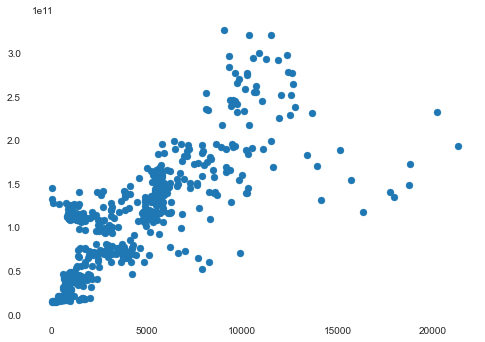

In [76]:
plt.scatter(notification_market_BTC['alert_id'], notification_market_BTC['market_y'])

In [77]:
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id
date,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,NaN,NaN,NaN,NaN,NaN,NaN,30,30
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112


In [78]:
notification_market_BTC.isnull().sum()

market_y                 0
high                     0
low                      0
open                     0
close                    0
volume                   0
high_daily_%_change      1
low_daily_%_change       1
open_daily_%_change      1
close_daily_%_change     1
volume_daily_%_change    1
market_daily_%_change    1
user_id                  0
alert_id                 0
dtype: int64

In [79]:
notification_market_BTC = notification_market_BTC.fillna(0)

# Linear Regression model

### Features selection

In [80]:
y = notification_market_BTC['market_daily_%_change']
y2 = notification_market_BTC['market_daily_%_change'].values


##### Split Data into test and training set

In [81]:
#Split data into test and train
x = notification_market_BTC[['high_daily_%_change', 'low_daily_%_change', 'volume_daily_%_change', 'open_daily_%_change', 'close_daily_%_change', 'alert_id']]
X_train, X_test, y_train, y_test=train_test_split(x,y, test_size=0.2, random_state=42)


### Model fit

In [82]:
lr = LinearRegression()
#Fit X and y 
lr.fit(X_train, y_train)
ypred = lr.predict(X_test)
#Metrics to evaluate the model 
r2_score(y_test, ypred), mean_absolute_error(y_test, ypred), np.sqrt(mean_squared_error(y_test, ypred))

(0.9999997893918354, 1.3714683404888596e-05, 1.8706278283493675e-05)

In [83]:
x = notification_market_BTC[['high_daily_%_change', 'low_daily_%_change', 'volume_daily_%_change', 'open_daily_%_change', 'close_daily_%_change', 'alert_id']].values

In [84]:
x = pd.DataFrame(x)
x.columns = ['high_daily_%_change', 'low_daily_%_change', 'volume_daily_%_change', 'open_daily_%_change', 'close_daily_%_change', 'alert_id']
# x

y =y.values
y = pd.DataFrame(y)

In [85]:
i = notification_market_BTC[(notification_market_BTC.alert_id == 85470)].index
notification_market_BTC = notification_market_BTC.drop(i)
notification_market_BTC["alert_id"].describe()

count      660.000000
mean      3829.266667
std       3587.269620
min         30.000000
25%        984.250000
50%       2568.000000
75%       5580.000000
max      21306.000000
Name: alert_id, dtype: float64

# Regression with alert's daily count % change

In [86]:
notification_market_BTC['alert__daily_count_%_change'] = notification_market_BTC['alert_id'].pct_change()

In [87]:
notification_market_BTC = notification_market_BTC.fillna(0)

In [88]:
x2 = notification_market_BTC[['high_daily_%_change', 'low_daily_%_change', 'volume_daily_%_change', 'open_daily_%_change', 'close_daily_%_change', 'alert__daily_count_%_change']].values

In [89]:
x2 = pd.DataFrame(x2)
x2.columns = ['high_daily_%_change', 'low_daily_%_change', 'volume_daily_%_change', 'open_daily_%_change', 'close_daily_%_change', 'alert__daily_count_%_change']
# x

In [90]:
notification_market_BTC.head().T

date,2017-01-17,2017-01-18,2017-01-19,2017-01-20,2017-01-21
market_y,1.462578e+10,1.428404e+10,1.448662e+10,1.442355e+10,1.485691e+10
high,9.105600e+02,9.175000e+02,9.046100e+02,8.994000e+02,9.273700e+02
low,8.308000e+02,8.583000e+02,8.843400e+02,8.870100e+02,8.955300e+02
open,8.309500e+02,9.093700e+02,8.883400e+02,8.981700e+02,8.955500e+02
close,9.079400e+02,8.866200e+02,8.990700e+02,8.950300e+02,9.217900e+02
volume,1.550950e+08,2.256770e+08,1.056250e+08,8.672840e+07,1.111580e+08
high_daily_%_change,0.000000e+00,7.621683e-03,-1.404905e-02,-5.759388e-03,3.109851e-02
low_daily_%_change,0.000000e+00,3.310063e-02,3.033904e-02,3.019201e-03,9.605303e-03
open_daily_%_change,0.000000e+00,9.437391e-02,-2.312590e-02,1.106558e-02,-2.917042e-03
close_daily_%_change,0.000000e+00,-2.348173e-02,1.404209e-02,-4.493532e-03,2.989844e-02


(array([ 1.,  0.,  0.,  0.,  1.,  0.,  1.,  0.,  1.,  0.,  0.,  0.,  1.,
         0.,  1.,  0.,  2.,  0.,  4.,  4.,  5.,  1.,  1.,  3.,  5.,  7.,
         2.,  7., 11.,  7.,  6.,  9.,  6., 12., 12., 12., 14., 19., 20.,
        21., 23., 38., 47., 46., 46., 40., 28., 21., 21., 17., 22., 11.,
        14., 11., 18.,  6.,  6.,  9.,  4.,  3.,  4.,  3.,  3.,  2.,  3.,
         3.,  1.,  1.,  2.,  1.,  1.,  1.,  1.,  1.,  0.,  0.,  1.,  2.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  1.]),
 array([-0.18741098, -0.18301215, -0.17861333, -0.1742145 , -0.16981567,
        -0.16541684, -0.16101802, -0.15661919, -0.15222036, -0.14782154,
        -0.14342271, -0.13902388, -0.13462505, -0.13022623, -0.1258274 ,
        -0.12142857, -0.11702974, -0.11263092, -0.10823209, -0.10383326,
        -0.09943443, -0.09503561, -0.09063678, -0.08623795, -0.08183913,
        -0.0774403 , -0.07304147, -0.06864264, -0.06424382, -0.059844

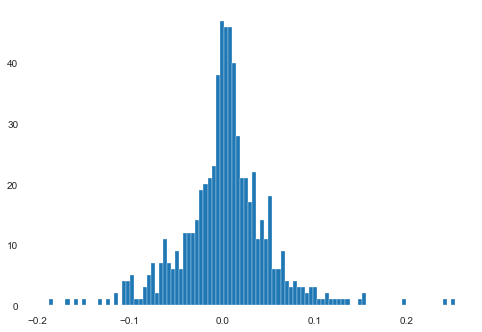

In [91]:
plt.hist(notification_market_BTC['close_daily_%_change'], bins = 100)

In [92]:
i = notification_market_BTC[(notification_market_BTC["alert__daily_count_%_change"] == 353.860000)].index
notification_market_BTC = notification_market_BTC.drop(i)
notification_market_BTC["alert__daily_count_%_change"].describe()



count    659.000000
mean       0.051003
std        0.385916
min       -0.852111
25%       -0.104615
50%       -0.001634
75%        0.143918
max        4.744249
Name: alert__daily_count_%_change, dtype: float64

In [93]:
i = notification_market_BTC[(notification_market_BTC["alert__daily_count_%_change"] >= 4)].index
notification_market_BTC = notification_market_BTC.drop(i)
notification_market_BTC["alert__daily_count_%_change"].describe()

count    658.000000
mean       0.043870
std        0.339972
min       -0.852111
25%       -0.105056
50%       -0.001719
75%        0.143434
max        2.266601
Name: alert__daily_count_%_change, dtype: float64

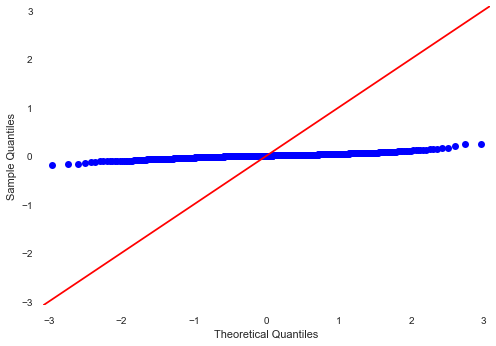

In [94]:
sm.qqplot(notification_market_BTC['close_daily_%_change'], line ='45')
py.show()

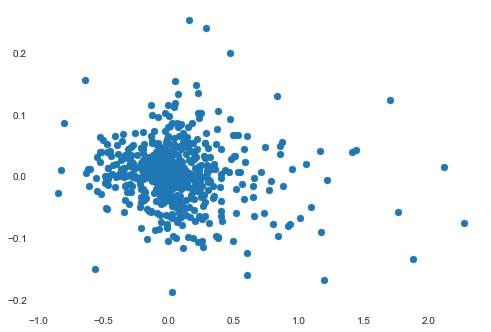

In [95]:
plt.scatter(notification_market_BTC['alert__daily_count_%_change'], notification_market_BTC['market_daily_%_change'])

In [96]:
notification_market_BTC['alert__daily_count_%_change'].describe()


count    658.000000
mean       0.043870
std        0.339972
min       -0.852111
25%       -0.105056
50%       -0.001719
75%        0.143434
max        2.266601
Name: alert__daily_count_%_change, dtype: float64

## MODELLING

# Regression on just the market data

***R squared which is the fraction of variance explained is shown above. This is the square of the correlation of the response(Market cap) and the variable. Since the R^2 is 1, this indicates that the model explains a large proportion of the variance in the response variable. ***

In [97]:
notification_market_BTC['change'] = np.where(notification_market_BTC['close_daily_%_change']>0, 1, 0)

In [98]:
notification_market_BTC

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change
date,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,1.550950e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,2.256770e+08,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,1.056250e+08,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,8.672840e+07,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,1.111580e+08,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-25,6.974927e+10,4120.87,3585.06,3880.78,4009.97,6.825640e+09,-0.066217,-0.055360,-0.107393,0.033295,0.458626,0.033389,2238,2238,0.022385,1
2018-11-26,6.573929e+10,4107.14,3643.92,4015.07,3779.13,6.476900e+09,-0.003332,0.016418,0.034604,-0.057567,-0.051093,-0.057491,1466,1466,-0.344951,0
2018-11-27,6.646897e+10,3862.96,3661.01,3765.95,3820.72,5.998720e+09,-0.059453,0.004690,-0.062046,0.011005,-0.073829,0.011100,1412,1412,-0.036835,1


In [99]:
# xxx = notification_market_BTC[['high_daily_%_change', 'low_daily_%_change', 'volume_daily_%_change',
#        'market_daily_%_change', 'alert__daily_count_%_change', 'change']]

In [100]:
notification_market_BTC.columns

Index(['market_y', 'high', 'low', 'open', 'close', 'volume',
       'high_daily_%_change', 'low_daily_%_change', 'open_daily_%_change',
       'close_daily_%_change', 'volume_daily_%_change',
       'market_daily_%_change', 'user_id', 'alert_id',
       'alert__daily_count_%_change', 'change'],
      dtype='object')

In [101]:
# fit_criteria.index.values.astype(int)[0]

In [102]:
notification_market_BTC_4 = notification_market_BTC.reset_index()

In [103]:
notification_market_BTC_4['date'] = pd.to_datetime(notification_market_BTC_4['date'])

# Getting rows below

In [104]:
notification_market_BTC_4['close_daily_%_change'].index = notification_market_BTC_4['close_daily_%_change'].index+1

In [105]:
k = pd.concat([notification_market_BTC_4, notification_market_BTC_4['close_daily_%_change']], axis = 1)

In [106]:
notification_market_BTC_5 = notification_market_BTC_4.drop(notification_market_BTC_4.columns[[10]], axis = 1)

In [107]:
k.columns

Index(['date', 'market_y', 'high', 'low', 'open', 'close', 'volume',
       'high_daily_%_change', 'low_daily_%_change', 'open_daily_%_change',
       'close_daily_%_change', 'volume_daily_%_change',
       'market_daily_%_change', 'user_id', 'alert_id',
       'alert__daily_count_%_change', 'change', 'close_daily_%_change'],
      dtype='object')

In [108]:
k.columns = ['date', 'market_y', 'high', 'low', 'open', 'close', 'volume',
       'high_daily_%_change', 'low_daily_%_change', 'open_daily_%_change',
       'close_daily_%_change', 'volume_daily_%_change',
       'market_daily_%_change', 'user_id', 'alert_id',
       'alert__daily_count_%_change', 'change',
       'close_shift_daily_%_change']

In [109]:
k.shape

(659, 18)

In [110]:
k2 = k.fillna(0)

In [111]:
y_k = k2['close_shift_daily_%_change']
y1_k = k2['close_shift_daily_%_change'].values

In [112]:
x_k = k2[['high_daily_%_change', 'low_daily_%_change', 'open_daily_%_change', 'volume_daily_%_change',
       'market_daily_%_change', 'alert__daily_count_%_change', 'alert_id']]

x1_k = k2[['high_daily_%_change', 'low_daily_%_change', 'open_daily_%_change', 'volume_daily_%_change',
       'market_daily_%_change']].values

In [113]:
result_k = ols("y_k ~ x_k['high_daily_%_change'] + x_k['volume_daily_%_change'] + x_k['low_daily_%_change']  + x_k['alert__daily_count_%_change']", data=x_k).fit()
display( result_k.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    y_k   R-squared:                       0.365
Model:                            OLS   Adj. R-squared:                  0.361
Method:                 Least Squares   F-statistic:                     93.90
Date:                Wed, 29 Sep 2021   Prob (F-statistic):           4.30e-63
Time:                        19:34:51   Log-Likelihood:                 1228.1
No. Observations:                 659   AIC:                            -2446.
Df Residuals:                     654   BIC:                            -2424.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.0013      0.002      0.874      0.382      -0.002       0.004
x_k['high_daily_%_change']             0.4574      0.054      8.432      0.000       0.351       0.564
x_k['volume_daily_%_change']          -0.0175      0.007     -2.579      0.010      -0.031      -0.004
x_k['low_daily_%_change']              0.2844      0.046      6.239      0.000       0.195       0.374
x_k['alert__daily_count_%_change']     0.0107      0.005      2.200      0.028       0.001       0.020
==============================================================================
Omnibus:                       90.616   Durbin-Watson:                   2.821
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              638.101
Skew:                           0.356   Prob(JB):                    2.74e-139
Kurtosis:                       7.768   Cond. No.                         45.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [114]:
result_k2 = ols("y_k ~ x_k['high_daily_%_change'] + x_k['volume_daily_%_change'] + x_k['low_daily_%_change']", data=x_k).fit()
display( result_k2.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    y_k   R-squared:                       0.360
Model:                            OLS   Adj. R-squared:                  0.357
Method:                 Least Squares   F-statistic:                     122.9
Date:                Wed, 29 Sep 2021   Prob (F-statistic):           3.91e-63
Time:                        19:34:51   Log-Likelihood:                 1225.7
No. Observations:                 659   AIC:                            -2443.
Df Residuals:                     655   BIC:                            -2425.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                        0.0016      0.002      1.090      0.276      -0.001       0.005
x_k['high_daily_%_change']       0.4728      0.054      8.764      0.000       0.367       0.579
x_k['volume_daily_%_change']    -0.0136      0.007     -2.076      0.038      -0.027      -0.001
x_k['low_daily_%_change']        0.2660      0.045      5.919      0.000       0.178       0.354
==============================================================================
Omnibus:                       87.319   Durbin-Watson:                   2.819
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              604.565
Skew:                           0.331   Prob(JB):                    5.25e-132
Kurtosis:                       7.645   Cond. No.                         44.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Bollinger Bands

In [115]:
k = k.set_index('date')
k.head()


,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,close_shift_daily_%_change
date,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.0,30.0,0.000000,0.0,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53.0,53.0,0.766667,0.0,0.000000
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165.0,165.0,2.113208,1.0,-0.023482
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85.0,85.0,-0.484848,0.0,0.014042
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112.0,112.0,0.317647,1.0,-0.004494


In [116]:
k = k.fillna(0)
k.head(2)

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,close_shift_daily_%_change
date,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.8,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.0,30.0,0.000000,0.0,0.0
2017-01-18,1.428404e+10,917.50,858.3,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53.0,53.0,0.766667,0.0,0.0


In [117]:
k['20_day_sma_close'] = k['close'].rolling(window=20).mean()
k.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,close_shift_daily_%_change,20_day_sma_close
date,,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.0,30.0,0.000000,0.0,0.000000,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53.0,53.0,0.766667,0.0,0.000000,NaN
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165.0,165.0,2.113208,1.0,-0.023482,NaN
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85.0,85.0,-0.484848,0.0,0.014042,NaN
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112.0,112.0,0.317647,1.0,-0.004494,NaN


In [118]:
k = k.dropna()

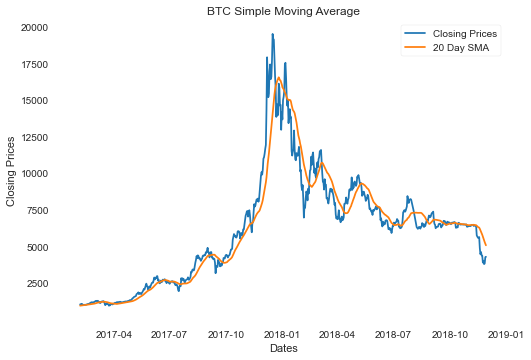

In [119]:
# Plot the data
plt.title('BTC Simple Moving Average')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(k['close'], label='Closing Prices')
plt.plot(k['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

In [120]:
k['Upper Band_1'] = k['20_day_sma_close'] + (1 * k['close'].rolling(window=20).std())
k['Lower Band_1'] = k['20_day_sma_close'] - (1 * k['close'].rolling(window=20).std())
k.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,close_shift_daily_%_change,20_day_sma_close,Upper Band_1,Lower Band_1
date,,,,,,,,,,,,,,,,,,,,
2017-02-05,1.658824e+10,1043.63,1022.37,1043.52,1027.34,114208000.0,-0.002170,0.007102,0.011820,-0.014920,-0.263478,-0.014799,507.0,507.0,0.204276,0.0,0.012613,941.0270,NaN,NaN
2017-02-06,1.676442e+10,1044.64,1028.16,1028.40,1038.15,111762000.0,0.000968,0.005663,-0.014489,0.010522,-0.021417,0.010621,479.0,479.0,-0.055227,1.0,-0.014920,947.5375,NaN,NaN
2017-02-07,1.714108e+10,1061.93,1040.14,1040.14,1061.35,146007008.0,0.016551,0.011652,0.011416,0.022347,0.306410,0.022468,560.0,560.0,0.169102,1.0,0.010522,956.2740,NaN,NaN
2017-02-08,1.717080e+10,1078.97,1037.49,1062.32,1063.07,201855008.0,0.016046,-0.002548,0.021324,0.001621,0.382502,0.001734,482.0,482.0,-0.139286,1.0,0.022347,964.4740,NaN,NaN
2017-02-09,1.606345e+10,1088.99,953.34,1064.70,994.38,407220000.0,0.009287,-0.081109,0.002240,-0.064615,1.017389,-0.064490,594.0,594.0,0.232365,0.0,0.001621,969.4415,NaN,NaN


In [121]:
k['Upper Band_2'] = k['20_day_sma_close'] + (2 * k['close'].rolling(window=20).std())
k['Lower Band_2'] = k['20_day_sma_close'] - (2 * k['close'].rolling(window=20).std())
k.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,...,user_id,alert_id,alert__daily_count_%_change,change,close_shift_daily_%_change,20_day_sma_close,Upper Band_1,Lower Band_1,Upper Band_2,Lower Band_2
date,,,,,,,,,,,,,,,,,,,,,
2017-02-05,1.658824e+10,1043.63,1022.37,1043.52,1027.34,114208000.0,-0.002170,0.007102,0.011820,-0.014920,...,507.0,507.0,0.204276,0.0,0.012613,941.0270,NaN,NaN,NaN,NaN
2017-02-06,1.676442e+10,1044.64,1028.16,1028.40,1038.15,111762000.0,0.000968,0.005663,-0.014489,0.010522,...,479.0,479.0,-0.055227,1.0,-0.014920,947.5375,NaN,NaN,NaN,NaN
2017-02-07,1.714108e+10,1061.93,1040.14,1040.14,1061.35,146007008.0,0.016551,0.011652,0.011416,0.022347,...,560.0,560.0,0.169102,1.0,0.010522,956.2740,NaN,NaN,NaN,NaN
2017-02-08,1.717080e+10,1078.97,1037.49,1062.32,1063.07,201855008.0,0.016046,-0.002548,0.021324,0.001621,...,482.0,482.0,-0.139286,1.0,0.022347,964.4740,NaN,NaN,NaN,NaN
2017-02-09,1.606345e+10,1088.99,953.34,1064.70,994.38,407220000.0,0.009287,-0.081109,0.002240,-0.064615,...,594.0,594.0,0.232365,0.0,0.001621,969.4415,NaN,NaN,NaN,NaN


In [122]:
k['Upper Band_3'] = k['20_day_sma_close'] + (3 * k['close'].rolling(window=20).std())
k['Lower Band_3'] = k['20_day_sma_close'] - (3 * k['close'].rolling(window=20).std())
k.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,...,alert__daily_count_%_change,change,close_shift_daily_%_change,20_day_sma_close,Upper Band_1,Lower Band_1,Upper Band_2,Lower Band_2,Upper Band_3,Lower Band_3
date,,,,,,,,,,,,,,,,,,,,,
2017-02-05,1.658824e+10,1043.63,1022.37,1043.52,1027.34,114208000.0,-0.002170,0.007102,0.011820,-0.014920,...,0.204276,0.0,0.012613,941.0270,NaN,NaN,NaN,NaN,NaN,NaN
2017-02-06,1.676442e+10,1044.64,1028.16,1028.40,1038.15,111762000.0,0.000968,0.005663,-0.014489,0.010522,...,-0.055227,1.0,-0.014920,947.5375,NaN,NaN,NaN,NaN,NaN,NaN
2017-02-07,1.714108e+10,1061.93,1040.14,1040.14,1061.35,146007008.0,0.016551,0.011652,0.011416,0.022347,...,0.169102,1.0,0.010522,956.2740,NaN,NaN,NaN,NaN,NaN,NaN
2017-02-08,1.717080e+10,1078.97,1037.49,1062.32,1063.07,201855008.0,0.016046,-0.002548,0.021324,0.001621,...,-0.139286,1.0,0.022347,964.4740,NaN,NaN,NaN,NaN,NaN,NaN
2017-02-09,1.606345e+10,1088.99,953.34,1064.70,994.38,407220000.0,0.009287,-0.081109,0.002240,-0.064615,...,0.232365,0.0,0.001621,969.4415,NaN,NaN,NaN,NaN,NaN,NaN


In [123]:
k = k.dropna()

In [124]:
k.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,...,alert__daily_count_%_change,change,close_shift_daily_%_change,20_day_sma_close,Upper Band_1,Lower Band_1,Upper Band_2,Lower Band_2,Upper Band_3,Lower Band_3
date,,,,,,,,,,,,,,,,,,,,,
2017-02-24,1.899242e+10,1200.39,1131.96,1172.71,1173.68,330759008.0,0.020202,0.013429,0.049621,0.005965,...,0.063804,1.0,0.044101,1050.4160,1106.159072,994.672928,1161.902143,938.929857,1217.645215,883.186785
2017-02-25,1.851191e+10,1174.85,1124.59,1170.41,1143.84,139960992.0,-0.021276,-0.006511,-0.001961,-0.025424,...,-0.324106,0.0,0.005965,1056.2410,1115.426454,997.055546,1174.611907,937.870093,1233.797361,878.684639
2017-02-26,1.886025e+10,1167.47,1130.20,1144.27,1165.20,116486000.0,-0.006282,0.004988,-0.022334,0.018674,...,-0.407850,1.0,-0.025424,1062.5935,1126.374843,998.812157,1190.156186,935.030814,1253.937529,871.249471
2017-02-27,1.910143e+10,1181.98,1163.38,1163.78,1179.97,131570000.0,0.012429,0.029358,0.017050,0.012676,...,0.204611,1.0,0.018674,1068.5245,1137.488753,999.560247,1206.453006,930.595994,1275.417259,861.631741
2017-02-28,1.910368e+10,1193.25,1171.82,1180.72,1179.97,184956000.0,0.009535,0.007255,0.014556,0.000000,...,0.038278,0.0,0.012676,1074.3695,1147.664995,1001.074005,1220.960491,927.778509,1294.255986,854.483014


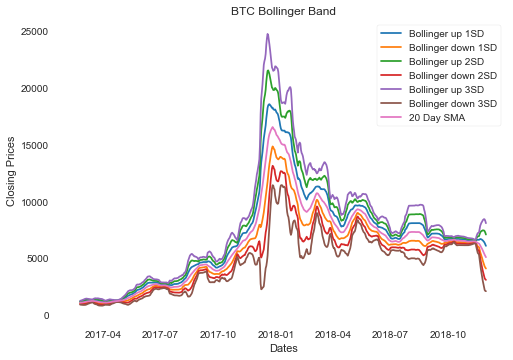

In [125]:
# Plot the data
plt.title('BTC Bollinger Band')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(k['Upper Band_1'], label='Bollinger up 1SD')
plt.plot(k['Lower Band_1'], label='Bollinger down 1SD')
plt.plot(k['Upper Band_2'], label='Bollinger up 2SD')
plt.plot(k['Lower Band_2'], label='Bollinger down 2SD')
plt.plot(k['Upper Band_3'], label='Bollinger up 3SD')
plt.plot(k['Lower Band_3'], label='Bollinger down 3SD')
plt.plot(k['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

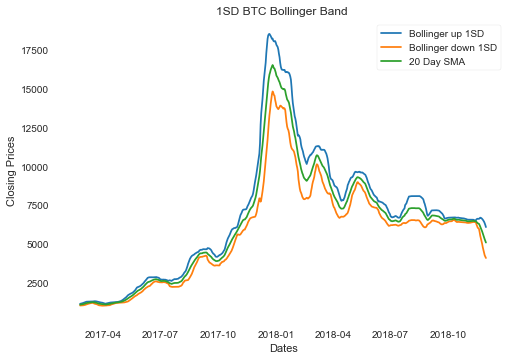

In [126]:
plt.title('1SD BTC Bollinger Band ')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(k['Upper Band_1'], label='Bollinger up 1SD')
plt.plot(k['Lower Band_1'], label='Bollinger down 1SD')
plt.plot(k['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

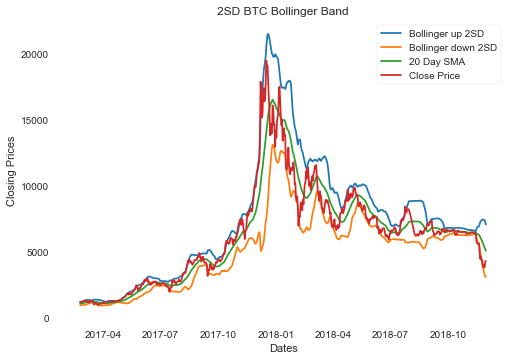

In [127]:
plt.title('2SD BTC Bollinger Band')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(k['Upper Band_2'], label='Bollinger up 2SD')
plt.plot(k['Lower Band_2'], label='Bollinger down 2SD')
plt.plot(k['20_day_sma_close'], label='20 Day SMA')
plt.plot(k['close'], label='Close Price')

# ax.fill_between(x_axis, k['Upper Band'], k['Lower Band'], color='grey')
plt.legend()
plt.show()

In [128]:
def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = 0
    
    for i in range(len(data)):
        if data[i-1] > lower_bb[i-1] and data[i] < lower_bb[i]:
            if signal != 1:
                buy_price.append(data[i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif data[i-1] < upper_bb[i-1] and data[i] > upper_bb[i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(data[i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
            
    return buy_price, sell_price, bb_signal

buy_price, sell_price, bb_signal = implement_bb_strategy(k['close'], k['Lower Band_2'], k['Upper Band_2'])

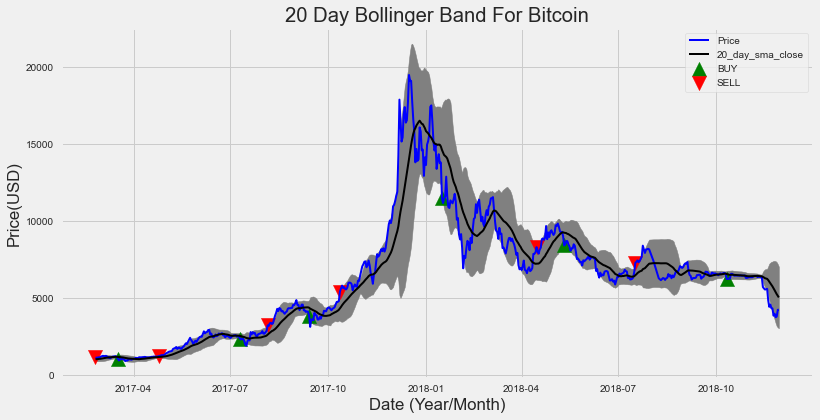

In [129]:
# set style, empty figure and axes
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

# Get index values for the X axis 
x_axis = k.index.get_level_values(0)

# Plot shaded 21 Day Bollinger Band 
ax.fill_between(x_axis, k['Upper Band_2'], k['Lower Band_2'], color='grey')

# Plot Adjust Closing Price and Moving Averages
ax.plot(x_axis, k['close'], color='blue', label = 'Price', lw=2)
ax.plot(x_axis, k['20_day_sma_close'], color='black', label = '20_day_sma_close', lw=2)

plt.scatter(k.index, buy_price, marker = '^', color = 'green', label = 'BUY', s = 200)

plt.scatter(k.index, sell_price, marker = 'v', color = 'red', label = 'SELL', s = 200)
# Set Title & Show the Image
ax.set_title('20 Day Bollinger Band For Bitcoin')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show();

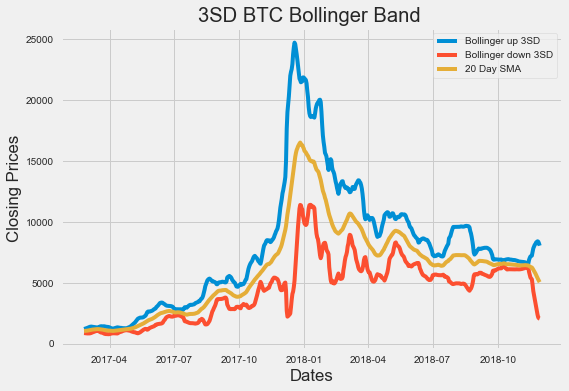

In [130]:
plt.title('3SD BTC Bollinger Band ')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(k['Upper Band_3'], label='Bollinger up 3SD')
plt.plot(k['Lower Band_3'], label='Bollinger down 3SD')
plt.plot(k['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

In [131]:
k_2 = notification_market_BTC_4.set_index('date')
k_2.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change
date,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1


In [132]:
col_mean = k["close"].rolling(window=20).mean()
col_std =  k["close"].rolling(window=20).std()

k["COL_ZSCORE"] = (k["close"] - col_mean)/col_std

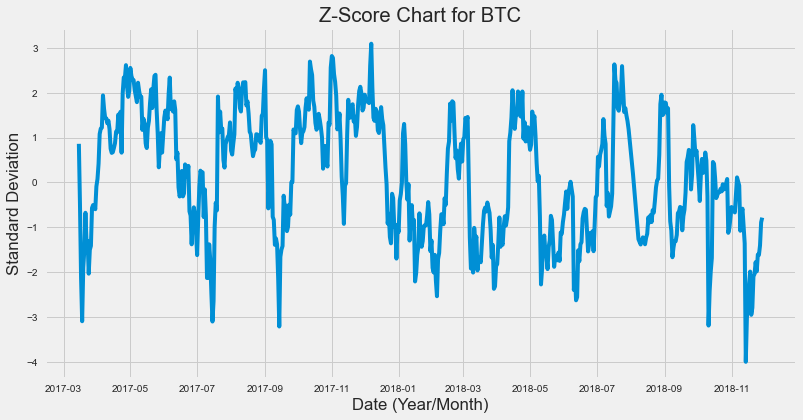

In [133]:
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
plt.xlabel('Date (Year/Month)')
plt.title('Z-Score Chart for BTC')
plt.xlabel('Date (Year/Month)')
plt.ylabel('Standard Deviation')
plt.plot(k["COL_ZSCORE"])
plt.show();

In [134]:
smac = k['close'].values

In [135]:
short_lb = 9 
long_lb = 21
signal_df = pd.DataFrame(index=k_2.index)
signal_df['signal'] = 0.0
signal_df['short_mav'] = k_2[['close']].rolling(window=short_lb,min_periods=1, center=False).mean()


In [136]:
k_2.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change
date,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1


In [137]:
signal_df['long_mav'] = k_2[['close']].rolling(window=long_lb, min_periods=1, center=False).mean()


In [138]:
signal_df['signal'][short_lb:] = np.where(signal_df['short_mav'][short_lb:] > signal_df['long_mav'][short_lb:], 1.0, 0.0)   


In [139]:
signal_df['positions'] = signal_df['signal'].diff()
signal_df[signal_df['positions'] == -1.0]


,signal,short_mav,long_mav,positions
date,,,,
2017-03-15,0.0,1199.721111,1207.165238,-1.0
2017-06-20,0.0,2597.968889,2638.530476,-1.0
2017-09-10,0.0,4394.368889,4398.430476,-1.0
2017-12-25,0.0,16104.733333,16227.723810,-1.0
2018-01-14,0.0,14918.000000,14927.009524,-1.0
2018-03-10,0.0,10445.114444,10481.063333,-1.0
2018-05-13,0.0,9128.913333,9224.312381,-1.0
2018-08-14,0.0,7037.328889,7233.216190,-1.0
2018-09-10,0.0,6726.672222,6779.426190,-1.0


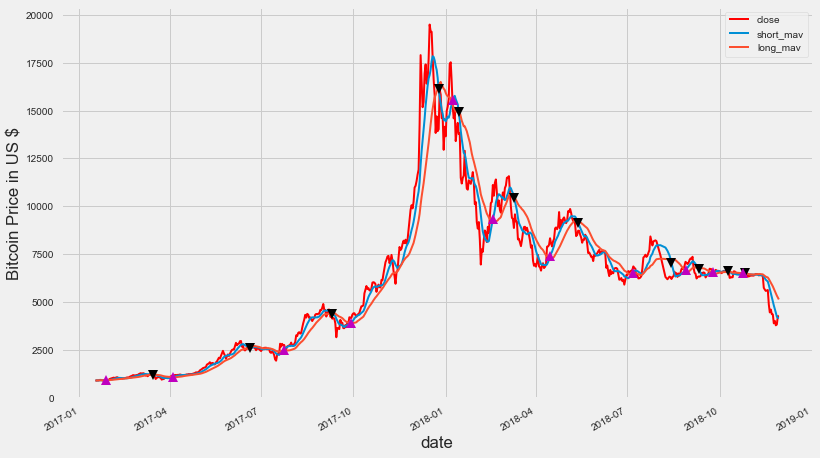

In [140]:
fig = plt.figure()
plt1 = fig.add_subplot(111,  ylabel='Bitcoin Price in US $')
k_2[['close']].plot(ax=plt1, color='r', lw=2.)

signal_df[['short_mav', 'long_mav']].plot(ax=plt1, lw=2., figsize=(12,8))
plt1.plot(signal_df.loc[signal_df.positions == -1.0].index,signal_df.short_mav[signal_df.positions == -1.0],'v',                     markersize=10, color='k')
plt1.plot(signal_df.loc[signal_df.positions == 1.0].index,signal_df.short_mav[signal_df.positions == 1.0],'^', markersize=10, color='m')         # Show the plotplt.show()


In [141]:
# initial trading capital
trad_capital= float(1000)

positions = pd.DataFrame(index=signal_df.index).fillna(0.0)

#Buy a 1000 USD in Bitcoins
positions['Position ($)'] = signal_df['signal']

portfolio = positions.multiply(k_2['close'], axis = 0)

pos_diff = positions.diff()

portfolio['holdings'] = (positions.multiply(k_2['close'], axis = 0)).sum(axis = 1)

portfolio['cash'] = trad_capital - (pos_diff.multiply(k_2['close'],axis = 0)).sum(axis = 1).cumsum()

portfolio['total'] = portfolio['cash'] + portfolio['holdings']

In [142]:
signal_df

,signal,short_mav,long_mav,positions
date,,,,
2017-01-17,0.0,907.940000,907.940000,NaN
2017-01-18,0.0,897.280000,897.280000,0.0
2017-01-19,0.0,897.876667,897.876667,0.0
2017-01-20,0.0,897.165000,897.165000,0.0
2017-01-21,0.0,902.090000,902.090000,0.0
...,...,...,...,...
2018-11-25,0.0,4636.488889,5572.186667,0.0
2018-11-26,0.0,4436.886667,5450.591429,0.0
2018-11-27,0.0,4236.573333,5330.898571,0.0


In [143]:
# k_2

In [144]:
portfolio ['returns'] = portfolio['total'].pct_change()

In [145]:
del portfolio['Position ($)']

print(portfolio.head())
print(portfolio.tail())

            holdings    cash   total  returns
date                                         
2017-01-17       0.0  1000.0  1000.0      NaN
2017-01-18       0.0  1000.0  1000.0      0.0
2017-01-19       0.0  1000.0  1000.0      0.0
2017-01-20       0.0  1000.0  1000.0      0.0
2017-01-21       0.0  1000.0  1000.0      0.0
            holdings     cash    total  returns
date                                           
2018-11-25       0.0  9502.38  9502.38      0.0
2018-11-26       0.0  9502.38  9502.38      0.0
2018-11-27       0.0  9502.38  9502.38      0.0
2018-11-28       0.0  9502.38  9502.38      0.0
2018-11-29       0.0  9502.38  9502.38      0.0


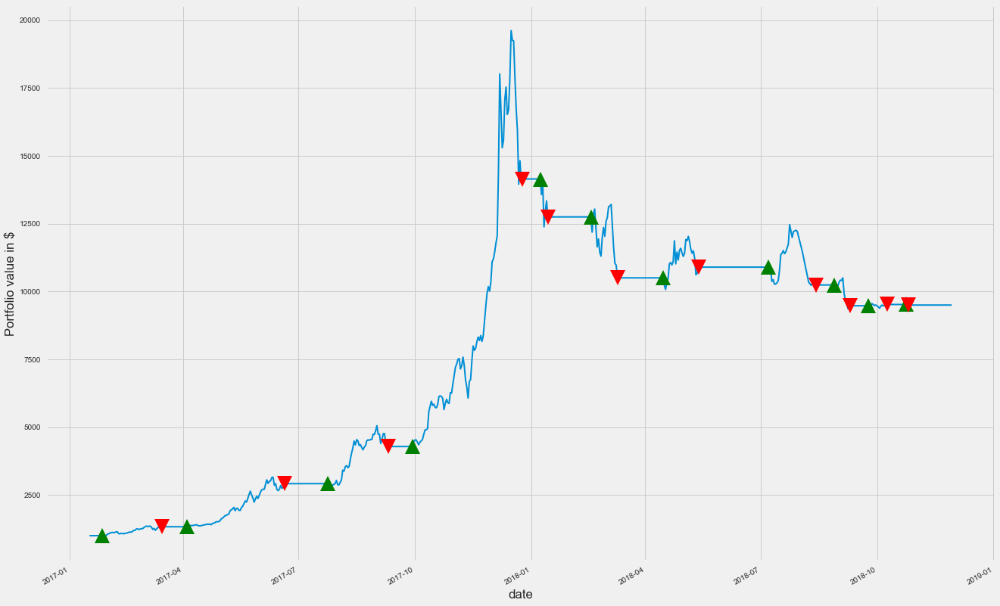

In [146]:
fig = plt.figure(figsize =(20,15))

ax1 = fig.add_subplot(111, ylabel='Portfolio value in $')

portfolio['total'].plot(ax=ax1, lw=2.)

ax1.plot(portfolio.loc[signal_df.positions == 1.0].index,portfolio.total[signal_df.positions == 1.0], '^', markersize = 20, color = 'g')

ax1.plot(portfolio.loc[signal_df.positions == -1.0].index,portfolio.total[signal_df.positions == -1.0], 'v', markersize = 20, color = 'r')

plt.show()

In [147]:
print('Portfolio Total Value as of 2018-11-29 ')
print(portfolio['total'].tail(1))

print('Absolute return as of 2018-11-29 ')

print((((portfolio['total'].tail(1)/float(1000)) - float(1))*100))

Portfolio Total Value as of 2018-11-29 
date
2018-11-29    9502.38
Name: total, dtype: float64
Absolute return as of 2018-11-29 
date
2018-11-29    850.238
Name: total, dtype: float64


# Can we do better that this simple model,  using the proprietary data. Using prediction to determine when to buy and to sell

# Logistics Model

In [148]:
notification_market_BTC.isnull().sum()

market_y                       0
high                           0
low                            0
open                           0
close                          0
volume                         0
high_daily_%_change            0
low_daily_%_change             0
open_daily_%_change            0
close_daily_%_change           0
volume_daily_%_change          0
market_daily_%_change          0
user_id                        0
alert_id                       0
alert__daily_count_%_change    0
change                         0
dtype: int64

In [149]:
X = notification_market_BTC[['high_daily_%_change','low_daily_%_change', 'volume_daily_%_change', 'alert__daily_count_%_change']]

y = notification_market_BTC[["change"]].values

In [150]:
notification_market_BTC.shape

(658, 16)

In [151]:
notification_market_BTC[["change"]].dtypes

change    int32
dtype: object

In [152]:
#Split into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Users\kakin\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


LogisticRegression()

In [153]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.66


In [154]:
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[ 22  65]
 [  3 108]]


C:\Users\kakin\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


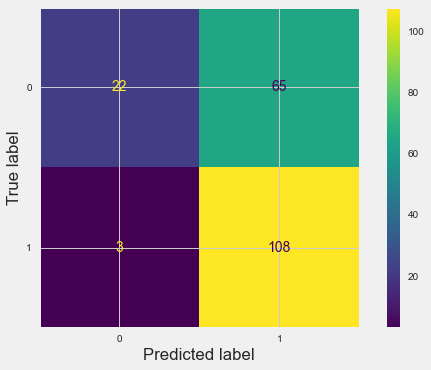

In [155]:
clf = SVC(random_state=0)
clf.fit(X_train, y_train)
SVC(random_state=0)
plot_confusion_matrix(logreg, X_test, y_test)  
plt.show()

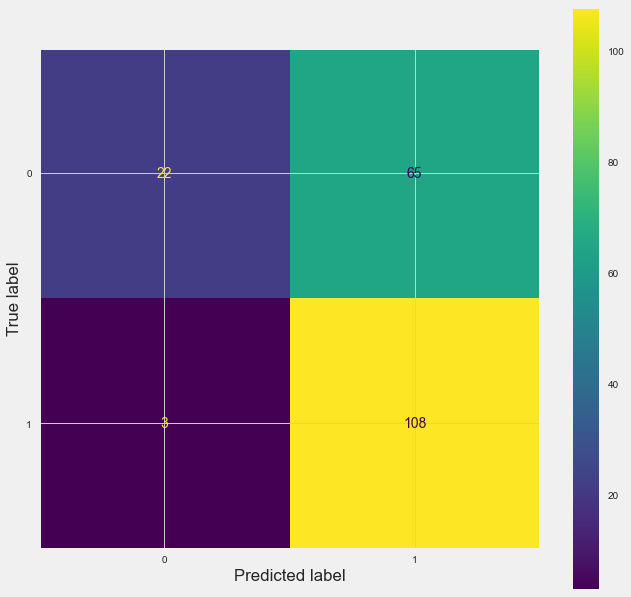

In [156]:
import seaborn as sns
from sklearn.metrics import plot_confusion_matrix

fig, ax = plt.subplots(figsize=(10, 10))
plot_confusion_matrix(
    logreg,  # Fitted estimator (it must have been fit)
    X_test,
    y_test,  # test sets
    ax=ax,
);

In [157]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.25      0.39        87
           1       0.62      0.97      0.76       111

    accuracy                           0.66       198
   macro avg       0.75      0.61      0.58       198
weighted avg       0.74      0.66      0.60       198



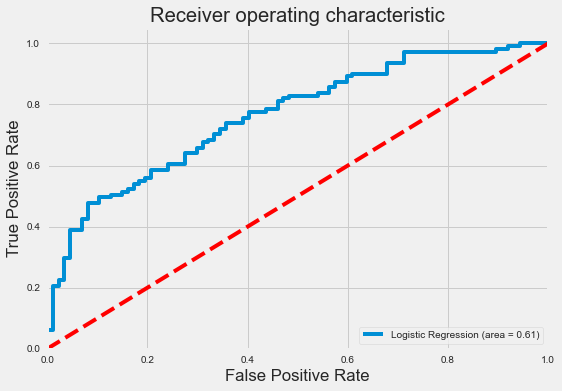

In [158]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [159]:
#value counts on classes
notification_market_BTC["change"].value_counts()

1    372
0    286
Name: change, dtype: int64

In [160]:
#Fitting the Logit model
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.539455
         Iterations 7
                              Results: Logit
Model:                  Logit               Pseudo R-squared:    0.212     
Dependent Variable:     y                   AIC:                 717.9227  
Date:                   2021-09-29 19:34    BIC:                 735.8795  
No. Observations:       658                 Log-Likelihood:      -354.96   
Df Model:               3                   LL-Null:             -450.45   
Df Residuals:           654                 LLR p-value:         3.7365e-41
Converged:              1.0000              Scale:               1.0000    
No. Iterations:         7.0000                                             
---------------------------------------------------------------------------
                             Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
---------------------------------------------------------------------------
high_daily_%_chan

In [161]:
notification_market_BTC["alert_id"].describe()

count      658.000000
mean      3807.489362
std       3551.376955
min         30.000000
25%        980.750000
50%       2549.000000
75%       5577.500000
max      21306.000000
Name: alert_id, dtype: float64

In [162]:
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(notification_market_BTC["alert_id"]))
# print(z)

In [163]:
threshold = 3
print(np.where(z > 3))

(array([338, 363, 364, 378, 379, 380, 383, 422], dtype=int64),)


## Logistic Model with market data

In [164]:
X = notification_market_BTC[['high_daily_%_change','low_daily_%_change', 'volume_daily_%_change']]

y = notification_market_BTC[["change"]].values

In [165]:
#Split into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Users\kakin\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


LogisticRegression()

In [166]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.64


In [167]:
# confusion_matrix = confusion_matrix(y_test, y_pred)
# print(confusion_matrix)

C:\Users\kakin\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


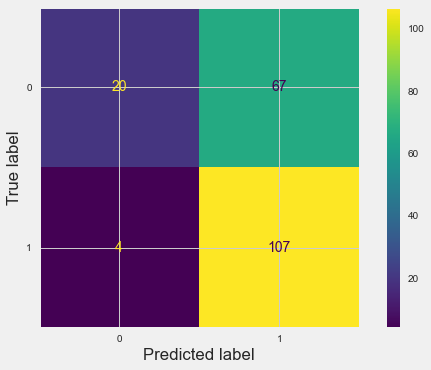

In [168]:
clf = SVC(random_state=0)
clf.fit(X_train, y_train)
SVC(random_state=0)
plot_confusion_matrix(logreg, X_test, y_test)  
plt.show()

In [169]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.23      0.36        87
           1       0.61      0.96      0.75       111

    accuracy                           0.64       198
   macro avg       0.72      0.60      0.56       198
weighted avg       0.71      0.64      0.58       198



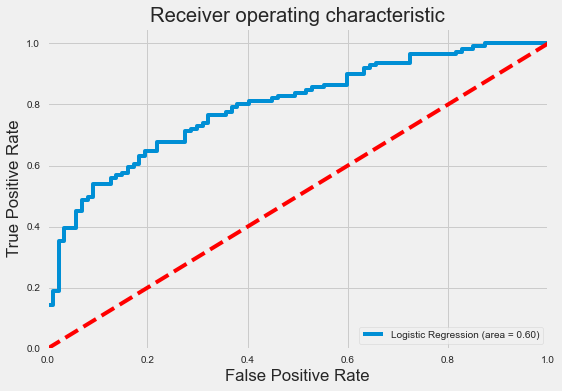

In [170]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [171]:
#Fitting the Logit model
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.542390
         Iterations 7
                           Results: Logit
Model:               Logit             Pseudo R-squared:  0.208     
Dependent Variable:  y                 AIC:               719.7848  
Date:                2021-09-29 19:34  BIC:               733.2524  
No. Observations:    658               Log-Likelihood:    -356.89   
Df Model:            2                 LL-Null:           -450.45   
Df Residuals:        655               LLR p-value:       2.3250e-41
Converged:           1.0000            Scale:             1.0000    
No. Iterations:      7.0000                                         
--------------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z|   [0.025  0.975]
--------------------------------------------------------------------
high_daily_%_change    8.3418   3.9419 2.1162 0.0343  0.6159 16.0678
low_daily_%_change    28.506

In [172]:
# i = notification_market_BTC[(notification_market_BTC.alert_id == 85470)].index
# notification_market_BTC = notification_market_BTC.drop(i)
# notification_market_BTC["alert_id"].describe()

# Rolling Average on Close Price

## Bollinger Bands on Close Price